In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/datasets/hassanjameelahmed/nike-nke-stock-market-analysis/NKE.csv


# LOAD DATA

In [2]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import TimeSeriesSplit
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# Set style for beautiful visualizations
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['font.size'] = 12



df = pd.read_csv('/kaggle/input/datasets/hassanjameelahmed/nike-nke-stock-market-analysis/NKE.csv')
df['Date'] = pd.to_datetime(df['Date'])
df.sort_values('Date', inplace=True)
df.reset_index(drop=True, inplace=True)


# CREATE ALL FEATURES

In [3]:


# Basic returns
df['Return'] = df['Close'].pct_change()
df['Log_Return'] = np.log(df['Close'] / df['Close'].shift(1))

# Volatility measures
df['Volatility_20d'] = df['Log_Return'].rolling(20).std() * np.sqrt(252)
df['Volatility_60d'] = df['Log_Return'].rolling(60).std() * np.sqrt(252)

# Volume features
df['Volume_Change'] = df['Volume'].pct_change()
df['Volume_MA_20'] = df['Volume'].rolling(20).mean()
df['Volume_Ratio'] = df['Volume'] / df['Volume_MA_20']

# Price features
df['Price_Range'] = (df['High'] - df['Low']) / df['Close'] * 100
df['Close_Open'] = (df['Close'] - df['Open']) / df['Open'] * 100
df['High_Low_Ratio'] = df['High'] / df['Low']

# Technical indicators
def compute_rsi(series, period=14):
    delta = series.diff()
    gain = delta.where(delta > 0, 0)
    loss = -delta.where(delta < 0, 0)
    avg_gain = gain.rolling(period).mean()
    avg_loss = loss.rolling(period).mean()
    rs = avg_gain / avg_loss
    return 100 - (100 / (1 + rs))

def compute_macd(series, fast=12, slow=26, signal=9):
    exp1 = series.ewm(span=fast, adjust=False).mean()
    exp2 = series.ewm(span=slow, adjust=False).mean()
    macd_line = exp1 - exp2
    signal_line = macd_line.ewm(span=signal, adjust=False).mean()
    histogram = macd_line - signal_line
    return macd_line, signal_line, histogram

df['RSI'] = compute_rsi(df['Close'])
df['MACD'], df['MACD_Signal'], df['MACD_Hist'] = compute_macd(df['Close'])

# Moving averages
df['SMA_50'] = df['Close'].rolling(50).mean()
df['SMA_200'] = df['Close'].rolling(200).mean()

# Bollinger Bands
df['BB_Middle'] = df['Close'].rolling(20).mean()
df['BB_Std'] = df['Close'].rolling(20).std()
df['BB_Upper'] = df['BB_Middle'] + 2 * df['BB_Std']
df['BB_Lower'] = df['BB_Middle'] - 2 * df['BB_Std']

print(f"Features created. Data shape: {df.shape}")
print(f"Columns: {df.columns.tolist()}")

Features created. Data shape: (6559, 26)
Columns: ['Date', 'Close', 'High', 'Low', 'Open', 'Volume', 'Return', 'Log_Return', 'Volatility_20d', 'Volatility_60d', 'Volume_Change', 'Volume_MA_20', 'Volume_Ratio', 'Price_Range', 'Close_Open', 'High_Low_Ratio', 'RSI', 'MACD', 'MACD_Signal', 'MACD_Hist', 'SMA_50', 'SMA_200', 'BB_Middle', 'BB_Std', 'BB_Upper', 'BB_Lower']


# DATA SUMMARY

In [4]:


print(df.describe().T)

missing = df.isnull().sum()
missing_pct = (missing / len(df) * 100).round(2)
missing_df = pd.DataFrame({'Missing Count': missing, 'Missing %': missing_pct})
print("\nMissing Values:\n", missing_df[missing_df['Missing Count'] > 0])

                 count                        mean                  min  \
Date              6559  2013-01-15 02:43:07.345632  2000-01-03 00:00:00   
Close           6559.0                   42.201151             2.467967   
High            6559.0                   42.637645             2.514423   
Low             6559.0                   41.762623             2.398283   
Open            6559.0                   42.200481             2.502809   
Volume          6559.0             10669005.564873            1821900.0   
Return          6558.0                    0.000594            -0.199809   
Log_Return      6558.0                      0.0004            -0.222905   
Volatility_20d  6539.0                    0.276355             0.081627   
Volatility_60d  6499.0                    0.284557             0.117242   
Volume_Change   6558.0                    0.086353            -0.787124   
Volume_MA_20    6540.0             10668474.890673            4061345.0   
Volume_Ratio    6540.0   

# EDA

##  Distribution and boxplot analysis for key numerical columns

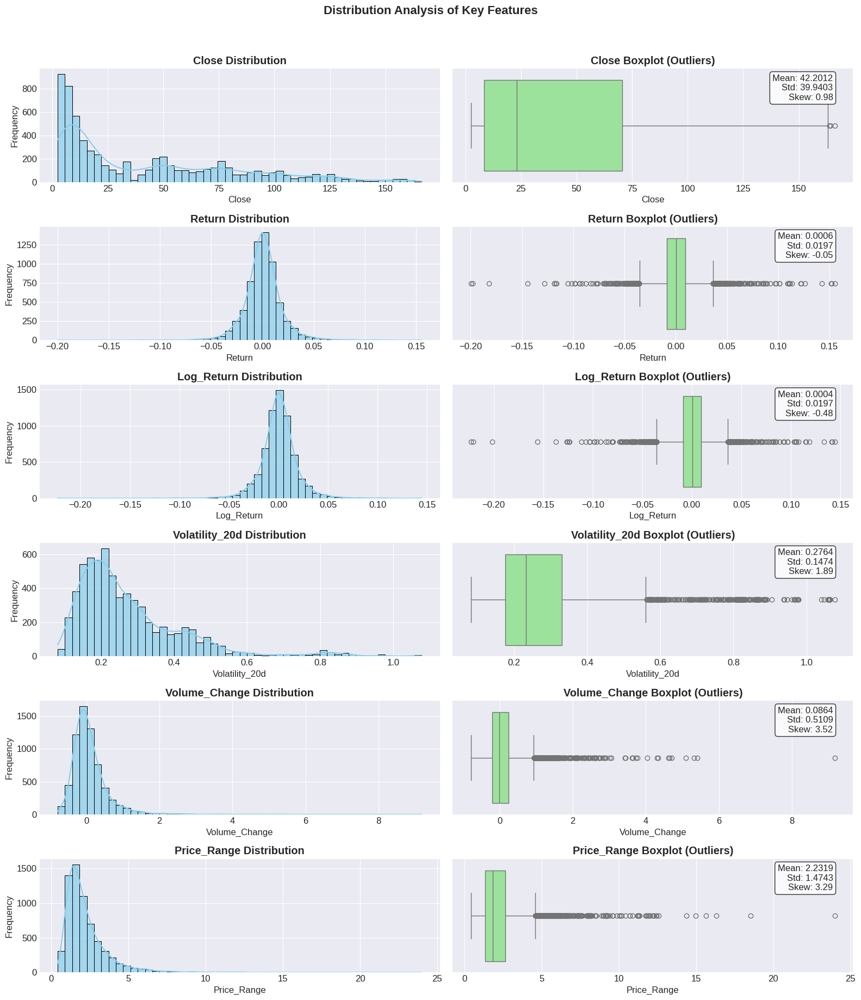

In [5]:
# Distribution and boxplot analysis for key numerical columns
num_cols = ['Close', 'Return', 'Log_Return', 'Volatility_20d', 'Volume_Change', 'Price_Range']

fig, axes = plt.subplots(len(num_cols), 2, figsize=(16, len(num_cols)*3))
fig.suptitle('Distribution Analysis of Key Features', fontsize=16, fontweight='bold', y=1.02)

for i, col in enumerate(num_cols):
    # Handle NaN values
    data_clean = df[col].dropna()
    
    # Histogram with KDE
    sns.histplot(data_clean, bins=50, kde=True, ax=axes[i,0], color='skyblue', alpha=0.7)
    axes[i,0].set_title(f'{col} Distribution', fontweight='bold')
    axes[i,0].set_xlabel(col)
    axes[i,0].set_ylabel('Frequency')
    
    # Boxplot
    sns.boxplot(x=data_clean, ax=axes[i,1], color='lightgreen')
    axes[i,1].set_title(f'{col} Boxplot (Outliers)', fontweight='bold')
    axes[i,1].set_xlabel(col)
    
    # Add statistics annotation
    stats_text = f"Mean: {data_clean.mean():.4f}\nStd: {data_clean.std():.4f}\nSkew: {data_clean.skew():.2f}"
    axes[i,1].text(0.95, 0.95, stats_text, transform=axes[i,1].transAxes, 
                   verticalalignment='top', horizontalalignment='right',
                   bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

## Nike Stock Price with Technical Indicators', 
## Trading Volume
## Relative Strength Index (RSI)

In [6]:

fig = make_subplots(
    rows=3, cols=1,
    shared_xaxes=True,
    vertical_spacing=0.05,
    row_heights=[0.5, 0.25, 0.25],
    subplot_titles=('Nike Stock Price with Technical Indicators', 
                    'Trading Volume', 
                    'Relative Strength Index (RSI)')
)

# Price with SMA and Bollinger Bands
fig.add_trace(go.Scatter(x=df['Date'], y=df['Close'], name='Close Price', 
                         line=dict(color='#2E86AB', width=1.5)), row=1, col=1)
fig.add_trace(go.Scatter(x=df['Date'], y=df['SMA_50'], name='50-Day SMA', 
                         line=dict(color='#F18F01', width=1.5, dash='dash')), row=1, col=1)
fig.add_trace(go.Scatter(x=df['Date'], y=df['SMA_200'], name='200-Day SMA', 
                         line=dict(color='#C73E1D', width=2)), row=1, col=1)
fig.add_trace(go.Scatter(x=df['Date'], y=df['BB_Upper'], name='Upper BB', 
                         line=dict(color='gray', width=1, dash='dot'), showlegend=True), row=1, col=1)
fig.add_trace(go.Scatter(x=df['Date'], y=df['BB_Lower'], name='Lower BB', 
                         line=dict(color='gray', width=1, dash='dot'), fill='tonexty', 
                         fillcolor='rgba(128,128,128,0.2)'), row=1, col=1)

# Volume with color coding
colors = ['red' if row['Return'] < 0 else 'green' for idx, row in df.iterrows()]
fig.add_trace(go.Bar(x=df['Date'], y=df['Volume'], name='Volume', 
                     marker_color=colors, opacity=0.7), row=2, col=1)

# RSI with overbought/oversold zones
fig.add_trace(go.Scatter(x=df['Date'], y=df['RSI'], name='RSI', 
                         line=dict(color='#5D9B9B', width=1.5)), row=3, col=1)
fig.add_hline(y=70, line_dash="dash", line_color="red", row=3, col=1)
fig.add_hline(y=30, line_dash="dash", line_color="green", row=3, col=1)
fig.add_hrect(y0=70, y1=100, fillcolor="red", opacity=0.2, line_width=0, row=3, col=1)
fig.add_hrect(y0=0, y1=30, fillcolor="green", opacity=0.2, line_width=0, row=3, col=1)

fig.update_layout(title_text="Nike Stock: Complete Technical Analysis (2000-2026)", 
                  height=900, showlegend=True, hovermode='x unified')
fig.update_xaxes(title_text="Date", row=3, col=1)
fig.update_yaxes(title_text="Price (USD)", row=1, col=1)
fig.update_yaxes(title_text="Volume", row=2, col=1)
fig.update_yaxes(title_text="RSI", row=3, col=1)

fig.show()

## Daily Returns Distribution
## 'Q-Q Plot (Normality Test) 
## Returns Over Time
 ## Volatility Clustering
## Returns by Day of Week 
## Monthly Returns Heatmap

In [7]:

fig = make_subplots(
    rows=2, cols=3,
    subplot_titles=('Daily Returns Distribution', 'Q-Q Plot (Normality Test)', 
                    'Returns Over Time', 'Volatility Clustering', 
                    'Returns by Day of Week', 'Monthly Returns Heatmap'),
    specs=[[{'type': 'histogram'}, {'type': 'scatter'}, {'type': 'scatter'}],
           [{'type': 'box'}, {'type': 'heatmap'}, {'type': 'heatmap'}]],
    horizontal_spacing=0.1,
    vertical_spacing=0.12
)

# 1. Returns Distribution
returns_clean = df['Return'].dropna()
fig.add_trace(go.Histogram(x=returns_clean * 100, nbinsx=100, 
                           name='Returns', marker_color='#2E86AB', 
                           opacity=0.7), row=1, col=1)
fig.add_vline(x=0, line_dash="dash", line_color="red", row=1, col=1)

# 2. Q-Q Plot
from scipy import stats
qq_data = stats.probplot(returns_clean.dropna(), dist="norm")
fig.add_trace(go.Scatter(x=qq_data[0][0], y=qq_data[0][1], mode='markers', 
                         marker=dict(color='#F18F01', size=4), name='Sample'), row=1, col=2)
fig.add_trace(go.Scatter(x=qq_data[0][0], y=qq_data[1][0] + qq_data[1][1]*qq_data[0][0], 
                         mode='lines', line=dict(color='red', dash='dash'), 
                         name='Normal'), row=1, col=2)

# 3. Returns Over Time
colors = ['red' if x < 0 else 'green' for x in returns_clean * 100]
fig.add_trace(go.Bar(x=df['Date'][1:], y=returns_clean * 100, 
                     marker_color=colors, opacity=0.6, name='Returns'), row=1, col=3)

# 4. Volatility Clustering
volatility = df['Volatility_20d'].dropna()
fig.add_trace(go.Scatter(x=df['Date'][20:], y=volatility * 100, 
                         mode='lines', line=dict(color='#C73E1D', width=1.5),
                         fill='tozeroy', name='20-Day Volatility'), row=2, col=1)

# 5. Returns by Day of Week
df['Weekday'] = df['Date'].dt.day_name()
weekday_returns = df.groupby('Weekday')['Return'].agg(['mean', 'std']).reindex(
    ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday'])
fig.add_trace(go.Bar(x=weekday_returns.index, y=weekday_returns['mean'] * 100, 
                     error_y=dict(type='data', array=weekday_returns['std'] * 100),
                     marker_color='#5D9B9B', name='Avg Return'), row=2, col=2)

# 6. Monthly Returns Heatmap
monthly_returns = df.groupby([df['Date'].dt.year, df['Date'].dt.month])['Return'].mean().unstack()
fig.add_trace(go.Heatmap(z=monthly_returns.values * 100, x=monthly_returns.columns, 
                         y=monthly_returns.index, colorscale='RdYlGn', 
                         zmid=0, name='Monthly Returns'), row=2, col=3)

fig.update_layout(title_text="Nike Stock: Returns Distribution & Volatility Analysis", 
                  height=900, showlegend=False)
fig.update_xaxes(title_text="Returns (%)", row=1, col=1)
fig.update_xaxes(title_text="Theoretical Quantiles", row=1, col=2)
fig.update_xaxes(title_text="Date", row=1, col=3)
fig.update_xaxes(title_text="Date", row=2, col=1)
fig.update_yaxes(title_text="Volatility (%)", row=2, col=1)
fig.update_yaxes(title_text="Average Return (%)", row=2, col=2)
fig.update_yaxes(title_text="Year", row=2, col=3)

fig.show()

# Statistical summary


print(f"Mean Daily Return: {returns_clean.mean()*100:.4f}%")
print(f"Std Daily Return: {returns_clean.std()*100:.4f}%")
print(f"Skewness: {returns_clean.skew():.3f}")
print(f"Kurtosis: {returns_clean.kurtosis():.3f}")
print(f"Sharpe Ratio (Annualized): {returns_clean.mean()/returns_clean.std()*np.sqrt(252):.3f}")

Mean Daily Return: 0.0594%
Std Daily Return: 1.9651%
Skewness: -0.054
Kurtosis: 11.549
Sharpe Ratio (Annualized): 0.480


## Volume Distribution
## Price-Volume Relationship
 ## Volume by Year
 ## Volume Spike Detection
 ##  Volume Moving Averages  
 ## Volume-Price Correlation

In [8]:

fig = make_subplots(
    rows=3, cols=2,
    subplot_titles=('Volume Distribution', 'Price-Volume Relationship',
                    'Volume by Year', 'Volume Spike Detection',
                    'Volume Moving Averages', 'Volume-Price Correlation'),
    specs=[[{'type': 'histogram'}, {'type': 'scatter'}],
           [{'type': 'bar'}, {'type': 'scatter'}],
           [{'type': 'scatter'}, {'type': 'heatmap'}]]
)

# 1. Volume Distribution
fig.add_trace(go.Histogram(x=df['Volume']/1e6, nbinsx=50, 
                           marker_color='#2E86AB', name='Volume'), row=1, col=1)

# 2. Price-Volume Scatter
fig.add_trace(go.Scatter(x=df['Volume']/1e6, y=df['Close'], mode='markers',
                         marker=dict(color=df['Return'], colorscale='RdYlGn', 
                                   size=3, showscale=True, colorbar=dict(title="Return")),
                         text=df['Date'].dt.strftime('%Y-%m-%d'), name=''), row=1, col=2)

# 3. Volume by Year
yearly_volume = df.groupby(df['Date'].dt.year)['Volume'].mean() / 1e6
fig.add_trace(go.Bar(x=yearly_volume.index, y=yearly_volume.values, 
                     marker_color='#F18F01', name='Avg Daily Volume'), row=2, col=1)

# 4. Volume Spike Detection
volume_zscore = np.abs(stats.zscore(df['Volume']))
volume_spikes = df[volume_zscore > 3]
fig.add_trace(go.Scatter(x=df['Date'], y=df['Volume']/1e6, mode='lines', 
                         line=dict(color='gray', width=1), name='Volume'), row=2, col=2)
fig.add_trace(go.Scatter(x=volume_spikes['Date'], y=volume_spikes['Volume']/1e6, 
                         mode='markers', marker=dict(color='red', size=8, symbol='x'),
                         name='Volume Spikes (Z>3)'), row=2, col=2)

# 5. Volume Moving Averages
fig.add_trace(go.Scatter(x=df['Date'], y=df['Volume']/1e6, mode='lines', 
                         line=dict(color='gray', width=0.5), name='Daily Volume'), row=3, col=1)
fig.add_trace(go.Scatter(x=df['Date'], y=df['Volume_MA_20']/1e6, mode='lines', 
                         line=dict(color='#5D9B9B', width=2), name='20-Day MA'), row=3, col=1)
fig.add_trace(go.Scatter(x=df['Date'], y=df['Volume'].rolling(200).mean()/1e6, 
                         mode='lines', line=dict(color='#C73E1D', width=2), 
                         name='200-Day MA'), row=3, col=1)

# 6. Volume-Price Correlation Heatmap
corr_matrix = df[['Close', 'Volume', 'Return', 'Volatility_20d']].corr()
fig.add_trace(go.Heatmap(z=corr_matrix.values, x=corr_matrix.columns, 
                         y=corr_matrix.columns, colorscale='RdBu', 
                         zmid=0, text=corr_matrix.round(2).values, 
                         texttemplate='%{text}', textfont={"size": 10}), row=3, col=2)

fig.update_layout(title_text="Nike Stock: Volume Analysis & Market Participation", 
                  height=1000, showlegend=True)
fig.update_xaxes(title_text="Volume (Millions)", row=1, col=1)
fig.update_xaxes(title_text="Volume (Millions)", row=1, col=2)
fig.update_xaxes(title_text="Year", row=2, col=1)
fig.update_xaxes(title_text="Date", row=2, col=2)
fig.update_xaxes(title_text="Date", row=3, col=1)
fig.update_yaxes(title_text="Price (USD)", row=1, col=2)
fig.update_yaxes(title_text="Avg Daily Volume (Millions)", row=2, col=1)
fig.update_yaxes(title_text="Volume (Millions)", row=2, col=2)

fig.show()

# Volume spike analysis

print("VOLUME SPIKE ANALYSIS")

print(f"Total volume spikes detected: {len(volume_spikes)}")
print(f"Percentage of days with abnormal volume: {len(volume_spikes)/len(df)*100:.2f}%")
print("\nTop 5 Volume Spike Days:")
top_spikes = volume_spikes.nlargest(5, 'Volume')[['Date', 'Volume', 'Close', 'Return']]
for idx, row in top_spikes.iterrows():
    print(f"  • {row['Date'].strftime('%Y-%m-%d')}: Volume={row['Volume']/1e6:.1f}M, "
          f"Price=${row['Close']:.2f}, Return={row['Return']*100:.2f}%")

VOLUME SPIKE ANALYSIS
Total volume spikes detected: 106
Percentage of days with abnormal volume: 1.62%

Top 5 Volume Spike Days:
  • 2024-06-28: Volume=130.0M, Price=$72.94, Return=-19.98%
  • 2025-06-27: Volume=117.5M, Price=$71.21, Return=15.19%
  • 2025-12-19: Volume=108.7M, Price=$58.71, Return=-10.54%
  • 2001-02-27: Volume=97.8M, Price=$3.68, Return=-19.81%
  • 2012-06-29: Volume=86.3M, Price=$18.48, Return=-9.40%


# volatility and risk visualization

In [9]:

fig = make_subplots(
    rows=3, cols=2,
    subplot_titles=('Historical Volatility (Rolling Windows)', 
                    'Volatility Regime Detection',
                    'Value at Risk (VaR) Analysis', 
                    'Drawdown Analysis',
                    'Volatility Surface', 
                    'Risk-Return Profile'),
    specs=[[{'type': 'scatter'}, {'type': 'scatter'}],
           [{'type': 'bar'}, {'type': 'scatter'}],
           [{'type': 'heatmap'}, {'type': 'scatter'}]]
)

# 1. Rolling Volatility for different windows
for window, color in [(20, '#2E86AB'), (60, '#F18F01'), (120, '#C73E1D')]:
    vol = df['Log_Return'].rolling(window).std() * np.sqrt(252) * 100
    fig.add_trace(go.Scatter(x=df['Date'], y=vol, mode='lines', 
                             name=f'{window}-Day Vol', line=dict(color=color)), row=1, col=1)

# 2. Volatility Regime Detection using GMM
features = df[['Volatility_20d', 'Volume_Ratio']].dropna()
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)
gmm = GaussianMixture(n_components=3, random_state=42)
regimes = gmm.fit_predict(scaled_features)

fig.add_trace(go.Scatter(x=df['Date'][20:], y=df['Volatility_20d'][20:]*100, 
                         mode='lines', line=dict(color='gray', width=1), 
                         name='Volatility'), row=1, col=2)
for regime in range(3):
    mask = regimes == regime
    dates = df['Date'][20:][mask]
    vols = df['Volatility_20d'][20:][mask] * 100
    fig.add_trace(go.Scatter(x=dates, y=vols, mode='markers', 
                             marker=dict(size=4), name=f'Regime {regime}'), row=1, col=2)

# 3. VaR Analysis
returns = df['Return'].dropna()
var_95 = np.percentile(returns, 5)
var_99 = np.percentile(returns, 1)
var_historical = returns[returns < var_95]

fig.add_trace(go.Histogram(x=returns*100, nbinsx=100, name='Returns', 
                           marker_color='#2E86AB', opacity=0.7), row=2, col=1)
fig.add_vline(x=var_95*100, line_dash="dash", line_color="red", 
              annotation_text="95% VaR", row=2, col=1)
fig.add_vline(x=var_99*100, line_dash="dash", line_color="darkred", 
              annotation_text="99% VaR", row=2, col=1)

# 4. Drawdown Analysis
running_max = df['Close'].expanding().max()
drawdown = (df['Close'] - running_max) / running_max * 100
fig.add_trace(go.Scatter(x=df['Date'], y=drawdown, mode='lines', 
                         fill='tozeroy', line=dict(color='#C73E1D', width=1.5),
                         name='Drawdown %'), row=2, col=2)
fig.add_hline(y=0, line_dash="dash", line_color="gray")

# 5. Volatility Surface (Heatmap by Year and Month)
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
vol_surface = df.groupby(['Year', 'Month'])['Volatility_20d'].mean().unstack()
fig.add_trace(go.Heatmap(z=vol_surface.values*100, x=vol_surface.columns, 
                         y=vol_surface.index, colorscale='Viridis', 
                         name='Volatility'), row=3, col=1)

# 6. Risk-Return Profile
rolling_returns = df['Return'].rolling(252).mean() * 252 * 100
rolling_vol = df['Return'].rolling(252).std() * np.sqrt(252) * 100
rolling_sharpe = rolling_returns / rolling_vol

fig.add_trace(go.Scatter(x=rolling_vol, y=rolling_returns, mode='markers',
                         marker=dict(color=rolling_sharpe, colorscale='RdYlGn', 
                                   size=8, showscale=True, colorbar=dict(title="Sharpe")),
                         text=df['Date'].dt.strftime('%Y-%m-%d'), name=''), row=3, col=2)

fig.update_layout(title_text="Nike Stock: Volatility Dynamics & Risk Metrics", 
                  height=1000, showlegend=True)
fig.update_xaxes(title_text="Date", row=1, col=1)
fig.update_yaxes(title_text="Volatility (%)", row=1, col=1)
fig.update_xaxes(title_text="Date", row=1, col=2)
fig.update_yaxes(title_text="Volatility (%)", row=1, col=2)
fig.update_xaxes(title_text="Returns (%)", row=2, col=1)
fig.update_xaxes(title_text="Date", row=2, col=2)
fig.update_yaxes(title_text="Drawdown (%)", row=2, col=2)
fig.update_xaxes(title_text="Month", row=3, col=1)
fig.update_yaxes(title_text="Year", row=3, col=1)
fig.update_xaxes(title_text="Volatility (%)", row=3, col=2)
fig.update_yaxes(title_text="Returns (%)", row=3, col=2)

fig.show()


print("RISK METRICS SUMMARY")

print(f"95% Value at Risk (VaR): {var_95*100:.2f}%")
print(f"99% Value at Risk (VaR): {var_99*100:.2f}%")
print(f"Expected Shortfall (CVaR 95%): {var_historical.mean()*100:.2f}%")
print(f"Maximum Drawdown: {drawdown.min():.2f}%")
print(f"Maximum Drawdown Date: {drawdown.idxmin()}")

RISK METRICS SUMMARY
95% Value at Risk (VaR): -2.77%
99% Value at Risk (VaR): -5.00%
Expected Shortfall (CVaR 95%): -4.39%
Maximum Drawdown: -68.53%
Maximum Drawdown Date: 6354


# Market regime analysis with  visualization

In [10]:

# Prepare features for regime detection
features_regime = pd.DataFrame({
    'returns': df['Return'].values,
    'volatility': df['Volatility_20d'].values,
    'volume': df['Volume_Ratio'].values
}).dropna()

scaler = StandardScaler()
scaled_features = scaler.fit_transform(features_regime)

# Fit GMM for regime detection
gmm_regime = GaussianMixture(n_components=4, random_state=42, n_init=10)
regime_labels = gmm_regime.fit_predict(scaled_features)
regime_probs = gmm_regime.predict_proba(scaled_features)

# Create regime dataframe
regime_df = pd.DataFrame({
    'Date': df['Date'][20:],
    'Close': df['Close'][20:],
    'Return': df['Return'][20:],
    'Volatility': df['Volatility_20d'][20:],
    'Volume_Ratio': df['Volume_Ratio'][20:],
    'Regime': regime_labels
})

# Add regime probabilities
for i in range(4):
    regime_df[f'Prob_Regime_{i}'] = regime_probs[:, i]

# Create regime visualization
fig = make_subplots(
    rows=4, cols=1,
    shared_xaxes=True,
    vertical_spacing=0.05,
    row_heights=[0.4, 0.2, 0.2, 0.2],
    subplot_titles=('Market Regime Detection (4 States)', 'Daily Returns by Regime',
                    'Volatility by Regime', 'Regime Transition Probabilities')
)

# 1. Price with regime coloring
for regime in range(4):
    mask = regime_df['Regime'] == regime
    fig.add_trace(go.Scatter(x=regime_df['Date'][mask], y=regime_df['Close'][mask],
                             mode='markers', marker=dict(size=3), 
                             name=f'Regime {regime}', legendgroup=f'regime{regime}'), row=1, col=1)
fig.add_trace(go.Scatter(x=regime_df['Date'], y=regime_df['Close'], 
                         mode='lines', line=dict(color='gray', width=1),
                         name='Price', showlegend=False), row=1, col=1)

# 2. Returns by regime
for regime in range(4):
    mask = regime_df['Regime'] == regime
    fig.add_trace(go.Scatter(x=regime_df['Date'][mask], y=regime_df['Return'][mask]*100,
                             mode='markers', marker=dict(size=2, opacity=0.5),
                             name=f'Regime {regime}', legendgroup=f'regime{regime}',
                             showlegend=False), row=2, col=1)

# 3. Volatility by regime
for regime in range(4):
    mask = regime_df['Regime'] == regime
    fig.add_trace(go.Scatter(x=regime_df['Date'][mask], y=regime_df['Volatility'][mask]*100,
                             mode='markers', marker=dict(size=2, opacity=0.5),
                             name=f'Regime {regime}', legendgroup=f'regime{regime}',
                             showlegend=False), row=3, col=1)

# 4. Regime probabilities area chart
for i in range(4):
    fig.add_trace(go.Scatter(x=regime_df['Date'], y=regime_df[f'Prob_Regime_{i}'], 
                             mode='lines', fill='tozeroy', 
                             name=f'Regime {i} Probability', 
                             stackgroup='one'), row=4, col=1)

fig.update_layout(title_text="Nike Stock: Hidden Market Regimes Detection", 
                  height=1000, hovermode='x unified')
fig.update_xaxes(title_text="Date", row=4, col=1)
fig.update_yaxes(title_text="Price (USD)", row=1, col=1)
fig.update_yaxes(title_text="Returns (%)", row=2, col=1)
fig.update_yaxes(title_text="Volatility (%)", row=3, col=1)
fig.update_yaxes(title_text="Probability", row=4, col=1)

fig.show()

# Regime statistics

print("MARKET REGIME CHARACTERISTICS")

for regime in range(4):
    regime_data = regime_df[regime_df['Regime'] == regime]
    if len(regime_data) > 0:
        print(f"\nRegime {regime}:")
        print(f"  • Duration: {len(regime_data)} days ({len(regime_data)/len(regime_df)*100:.1f}%)")
        print(f"  • Avg Return: {regime_data['Return'].mean()*100:.3f}%")
        print(f"  • Avg Volatility: {regime_data['Volatility'].mean()*100:.1f}%")
        print(f"  • Avg Volume Ratio: {regime_data['Volume_Ratio'].mean():.2f}x normal")

MARKET REGIME CHARACTERISTICS

Regime 0:
  • Duration: 444 days (6.8%)
  • Avg Return: 0.667%
  • Avg Volatility: 58.1%
  • Avg Volume Ratio: 1.84x normal

Regime 1:
  • Duration: 3625 days (55.4%)
  • Avg Return: 0.007%
  • Avg Volatility: 19.3%
  • Avg Volume Ratio: 0.88x normal

Regime 2:
  • Duration: 1414 days (21.6%)
  • Avg Return: 0.869%
  • Avg Volatility: 38.5%
  • Avg Volume Ratio: 0.80x normal

Regime 3:
  • Duration: 1056 days (16.1%)
  • Avg Return: -1.095%
  • Avg Volatility: 28.9%
  • Avg Volume Ratio: 1.40x normal


# ML Model Performance Visualization

In [11]:

# Create features for ML
df_ml = df.copy()
lookbacks = [1, 3, 5, 10, 20]

# Create lagged features
for lag in lookbacks:
    df_ml[f'return_lag_{lag}'] = df_ml['Return'].shift(lag)
    df_ml[f'volume_lag_{lag}'] = df_ml['Volume_Ratio'].shift(lag)
    df_ml[f'volatility_lag_{lag}'] = df_ml['Volatility_20d'].shift(lag)

# Technical indicators lagged
df_ml['rsi_lag'] = df_ml['RSI'].shift(1)
df_ml['macd_lag'] = df_ml['MACD'].shift(1)

# Target: next day return
df_ml['target'] = df_ml['Return'].shift(-1)

# Drop NaN and prepare data
df_ml = df_ml.dropna()
feature_cols = [c for c in df_ml.columns if 'lag' in c or 'ratio' in c]
feature_cols = [c for c in feature_cols if c not in ['target']]

# Train model with time series split
tscv = TimeSeriesSplit(n_splits=5)
rf_model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)

predictions = []
actuals = []
dates = []

for train_idx, val_idx in tscv.split(df_ml):
    X_train, X_val = df_ml[feature_cols].iloc[train_idx], df_ml[feature_cols].iloc[val_idx]
    y_train, y_val = df_ml['target'].iloc[train_idx], df_ml['target'].iloc[val_idx]
    
    rf_model.fit(X_train, y_train)
    y_pred = rf_model.predict(X_val)
    
    predictions.extend(y_pred)
    actuals.extend(y_val)
    dates.extend(df_ml['Date'].iloc[val_idx])

# Create forecast visualization
fig = make_subplots(
    rows=3, cols=2,
    subplot_titles=('Actual vs Predicted Returns', 'Prediction Error Distribution',
                    'Feature Importance (Top 15)', 'Model Performance by Time',
                    'Scatter Plot: Actual vs Predicted', 'Cumulative Strategy Returns'),
    specs=[[{'type': 'scatter'}, {'type': 'histogram'}],
           [{'type': 'bar'}, {'type': 'scatter'}],
           [{'type': 'scatter'}, {'type': 'scatter'}]]
)

# 1. Actual vs Predicted
fig.add_trace(go.Scatter(x=dates, y=np.array(actuals)*100, mode='lines', 
                         name='Actual Returns', line=dict(color='#2E86AB', width=1.5)), row=1, col=1)
fig.add_trace(go.Scatter(x=dates, y=np.array(predictions)*100, mode='lines', 
                         name='Predicted Returns', line=dict(color='#F18F01', width=1.5)), row=1, col=1)

# 2. Prediction Error Distribution
errors = (np.array(actuals) - np.array(predictions)) * 100
fig.add_trace(go.Histogram(x=errors, nbinsx=50, name='Prediction Error', 
                           marker_color='#C73E1D', opacity=0.7), row=1, col=2)
fig.add_vline(x=0, line_dash="dash", line_color="black", row=1, col=2)

# 3. Feature Importance
importances = rf_model.feature_importances_
indices = np.argsort(importances)[-15:]
fig.add_trace(go.Bar(x=[feature_cols[i] for i in indices], y=importances[indices],
                     marker_color='#5D9B9B', orientation='v'), row=2, col=1)

# 4. Model Performance by Time (Rolling R²)
window = 50
rolling_r2 = []
for i in range(window, len(predictions)):
    actual_window = np.array(actuals)[i-window:i]
    pred_window = np.array(predictions)[i-window:i]
    r2 = r2_score(actual_window, pred_window)
    rolling_r2.append(r2)

fig.add_trace(go.Scatter(x=dates[window:], y=rolling_r2, mode='lines', 
                         fill='tozeroy', line=dict(color='#2E86AB', width=2),
                         name='Rolling R²'), row=2, col=2)
fig.add_hline(y=0, line_dash="dash", line_color="red", row=2, col=2)

# 5. Scatter Plot
fig.add_trace(go.Scatter(x=np.array(actuals)*100, y=np.array(predictions)*100, 
                         mode='markers', marker=dict(color='#F18F01', size=5, opacity=0.6),
                         name='Predictions'), row=3, col=1)
fig.add_trace(go.Scatter(x=[-10, 10], y=[-10, 10], mode='lines', 
                         line=dict(color='red', dash='dash'), name='Perfect Fit'), row=3, col=1)

# 6. Cumulative Strategy Returns
strategy_returns = np.sign(predictions) * actuals
cumulative_actual = (1 + pd.Series(actuals)).cumprod() - 1
cumulative_strategy = (1 + pd.Series(strategy_returns)).cumprod() - 1

fig.add_trace(go.Scatter(x=dates, y=cumulative_actual*100, mode='lines', 
                         name='Buy & Hold', line=dict(color='#2E86AB', width=2)), row=3, col=2)
fig.add_trace(go.Scatter(x=dates, y=cumulative_strategy*100, mode='lines', 
                         name='ML Strategy', line=dict(color='#F18F01', width=2)), row=3, col=2)

fig.update_layout(title_text="Machine Learning Forecasting: Random Forest Model Performance", 
                  height=1000, showlegend=True)
fig.update_xaxes(title_text="Date", row=1, col=1)
fig.update_xaxes(title_text="Prediction Error (%)", row=1, col=2)
fig.update_xaxes(title_text="Features", row=2, col=1)
fig.update_xaxes(title_text="Date", row=2, col=2)
fig.update_xaxes(title_text="Actual Returns (%)", row=3, col=1)
fig.update_xaxes(title_text="Date", row=3, col=2)
fig.update_yaxes(title_text="Returns (%)", row=1, col=1)
fig.update_yaxes(title_text="Frequency", row=1, col=2)
fig.update_yaxes(title_text="Importance", row=2, col=1)
fig.update_yaxes(title_text="R² Score", row=2, col=2)
fig.update_yaxes(title_text="Predicted Returns (%)", row=3, col=1)
fig.update_yaxes(title_text="Cumulative Returns (%)", row=3, col=2)

fig.show()

# ML Performance Metrics

print("MACHINE LEARNING PERFORMANCE")

print(f"R² Score: {r2_score(actuals, predictions):.4f}")
print(f"MAE: {mean_absolute_error(actuals, predictions)*100:.4f}%")
print(f"RMSE: {np.sqrt(mean_squared_error(actuals, predictions))*100:.4f}%")
print(f"Directional Accuracy: {(np.sign(actuals) == np.sign(predictions)).mean()*100:.1f}%")
print(f"Strategy Sharpe Ratio: {(strategy_returns.mean()/strategy_returns.std()*np.sqrt(252)):.3f}")
print(f"Buy & Hold Sharpe: {(pd.Series(actuals).mean()/pd.Series(actuals).std()*np.sqrt(252)):.3f}")

MACHINE LEARNING PERFORMANCE
R² Score: -0.0520
MAE: 1.2822%
RMSE: 1.9072%
Directional Accuracy: 50.1%
Strategy Sharpe Ratio: 0.401
Buy & Hold Sharpe: 0.468


# Nike Stock (NKE): Complete 26-Year Performance

In [12]:

fig = make_subplots(
    rows=3, cols=3,
    subplot_titles=('Price Evolution (2000-2026)', 'Returns Distribution', 'Volume Profile',
                    'Drawdown History', 'Monthly Seasonality', 'Volatility Cone',
                    'Risk-Return Tradeoff', 'Regime Distribution', 'ML Forecast Accuracy'),
    specs=[[{'type': 'scatter'}, {'type': 'histogram'}, {'type': 'bar'}],
           [{'type': 'scatter'}, {'type': 'heatmap'}, {'type': 'scatter'}],
           [{'type': 'scatter'}, {'type': 'pie'}, {'type': 'indicator'}]],
    horizontal_spacing=0.12,
    vertical_spacing=0.12
)

# 1. Price Evolution with log scale
fig.add_trace(go.Scatter(x=df['Date'], y=df['Close'], mode='lines', 
                         line=dict(color='#2E86AB', width=2), name='Close'), row=1, col=1)

# 2. Returns Distribution
returns_clean = df['Return'].dropna() * 100
fig.add_trace(go.Histogram(x=returns_clean, nbinsx=80, 
                           marker_color='#F18F01', opacity=0.7), row=1, col=2)

# 3. Volume Profile (Box plot by decade)
df['Decade'] = (df['Date'].dt.year // 10) * 10
volume_by_decade = [df[df['Decade'] == d]['Volume'].values/1e6 for d in df['Decade'].unique()]
fig.add_trace(go.Box(y=volume_by_decade, x=df['Decade'].unique(), 
                     marker_color='#C73E1D', name='Volume'), row=1, col=3)

# 4. Drawdown History
running_max = df['Close'].expanding().max()
drawdown = (df['Close'] - running_max) / running_max * 100
fig.add_trace(go.Scatter(x=df['Date'], y=drawdown, mode='lines', 
                         fill='tozeroy', line=dict(color='#5D9B9B', width=1.5)), row=2, col=1)

# 5. Monthly Seasonality Heatmap
monthly_returns = df.pivot_table(values='Return', index=df['Date'].dt.year, 
                                  columns=df['Date'].dt.month, aggfunc='mean') * 100
fig.add_trace(go.Heatmap(z=monthly_returns.values, x=monthly_returns.columns, 
                         y=monthly_returns.index, colorscale='RdYlGn', zmid=0), row=2, col=2)

# 6. Volatility Cone
vol_percentiles = df['Volatility_20d'].dropna().describe(percentiles=[0.1, 0.25, 0.5, 0.75, 0.9])
fig.add_trace(go.Scatter(x=[1, 252], y=[vol_percentiles['90%']*100, vol_percentiles['90%']*100], 
                         mode='lines', line=dict(color='red', dash='dash'), name='90th %ile'), row=2, col=3)
fig.add_trace(go.Scatter(x=[1, 252], y=[vol_percentiles['50%']*100, vol_percentiles['50%']*100], 
                         mode='lines', line=dict(color='green', width=2), name='Median'), row=2, col=3)
fig.add_trace(go.Scatter(x=[1, 252], y=[vol_percentiles['10%']*100, vol_percentiles['10%']*100], 
                         mode='lines', line=dict(color='blue', dash='dash'), name='10th %ile'), row=2, col=3)

# 7. Risk-Return Tradeoff (Scatter by Year)
yearly_returns = df.groupby(df['Date'].dt.year)['Return'].mean() * 252 * 100
yearly_vol = df.groupby(df['Date'].dt.year)['Return'].std() * np.sqrt(252) * 100
fig.add_trace(go.Scatter(x=yearly_vol, y=yearly_returns, mode='markers+text',
                         marker=dict(size=10, color=yearly_returns/yearly_vol, 
                                   colorscale='RdYlGn', showscale=True),
                         text=yearly_returns.index, textposition="top center",
                         name='Yearly'), row=3, col=1)

# 8. Regime Distribution
if 'regime_df' in locals():
    regime_counts = regime_df['Regime'].value_counts()
    fig.add_trace(go.Pie(labels=regime_counts.index, values=regime_counts.values,
                         marker_colors=px.colors.qualitative.Set2), row=3, col=2)

# 9. Key Performance Indicator
total_return = (df['Close'].iloc[-1] / df['Close'].iloc[0] - 1) * 100
fig.add_trace(go.Indicator(mode="number+gauge+delta", value=total_return,
                           title={"text": "Total Return (2000-2026)"},
                           delta={'reference': 0, 'relative': False},
                           gauge={'axis': {'range': [None, 2000]},
                                  'bar': {'color': "#2E86AB"},
                                  'steps': [
                                      {'range': [0, 500], 'color': "lightgray"},
                                      {'range': [500, 1000], 'color': "gray"}],
                                  'threshold': {'line': {'color': "red", 'width': 4},
                                                'thickness': 0.75, 'value': 1000}}), row=3, col=3)

fig.update_layout(title_text="Nike Stock (NKE): Complete 26-Year Performance Dashboard", 
                  height=1000, showlegend=False, template='plotly_white')
fig.update_xaxes(title_text="Date", row=1, col=1)
fig.update_xaxes(title_text="Returns (%)", row=1, col=2)
fig.update_xaxes(title_text="Decade", row=1, col=3)
fig.update_xaxes(title_text="Date", row=2, col=1)
fig.update_xaxes(title_text="Month", row=2, col=2)
fig.update_xaxes(title_text="Time Horizon (Days)", row=2, col=3)
fig.update_xaxes(title_text="Volatility (%)", row=3, col=1)
fig.update_yaxes(title_text="Price (USD)", row=1, col=1)
fig.update_yaxes(title_text="Frequency", row=1, col=2)
fig.update_yaxes(title_text="Volume (Millions)", row=1, col=3)
fig.update_yaxes(title_text="Drawdown (%)", row=2, col=1)
fig.update_yaxes(title_text="Year", row=2, col=2)
fig.update_yaxes(title_text="Volatility (%)", row=2, col=3)
fig.update_yaxes(title_text="Returns (%)", row=3, col=1)

fig.show()
